# Klasifikasi Hasil Akhir Permainan Tic Tac Toe

Dalam tugas ini, kita akan melakukan analisis dan permodelan klasifikasi terkait dataset permainan tic tac toe yang bertujuan untuk menemukan pola dan korelasi antar fitur untuk mempredikasi hasil. Sehingga, dapat membantu mengambil keputusan yang lebih baik.

Dataset : https://archive.ics.uci.edu/dataset/101/tic+tac+toe+endgame


**Informasi Tambahan**

Dataset ini mengkodekan set lengkap konfigurasi papan yang mungkin di akhir permainan tic-tac-toe, di mana "x" diasumsikan telah bermain terlebih dahulu.  Konsep targetnya adalah "menang untuk x" (yaitu, benar ketika "x" memiliki salah satu dari 8 cara yang memungkinkan untuk membuat "tiga-dalam-baris").  

Menariknya, basis data mentah ini memberikan algoritma pohon keputusan yang dipreteli (misalnya, ID3) yang cocok.  Namun, algoritma CN2 berbasis aturan, algoritma pembelajaran berbasis contoh IB1 yang sederhana, dan algoritma pohon keputusan yang membangun fitur CITRE bekerja dengan baik di dalamnya.

## Requirements

In [1]:
# %pip install ucimlrepo
# %pip install pandas
# %pip install matplotlib
# %pip install seaborn
# %pip instal scikit-learn
# %pip install plotly-express

In [2]:
from ucimlrepo import fetch_ucirepo 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import BaggingClassifier  
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from subprocess import call
from IPython.display import Image
import joblib

## Data Understanding

Data yang digunakan merupakan dataset dari University of California (UCI) yang menyediakan banyak dataset yang siap digunakan untuk pembelajaran ataupun penelitian. Salah satu data yang dari UCI yang kami gunakan adalah dataset **Tic-Tac-Toe Endgame**. Dataset ini kami gunakan karena sesuai dengan topik dan kasus yang kami ambil. 

**Informasi Dataset**

- x = Simbol atau pola 'X'
- o = Simbol atau pola 'O'
- b = Blank atau kosong


1. top-left-square: {x,o,b}

2. top-middle-square: {x,o,b}

3. top-right-square: {x,o,b}

4. middle-left-square: {x,o,b}

5. middle-middle-square: {x,o,b}

6. middle-right-square: {x,o,b}

7. bottom-left-square: {x,o,b}

8. bottom-middle-square: {x,o,b}

9. bottom-right-square: {x,o,b}

10. Class: {positive,negative}

### Ambil data dari sumber data

In [3]:
# Ambil data dari UCI Repository
tic_tac_toe_endgame = fetch_ucirepo(id=101) 

# Ambil features dan targets
x = tic_tac_toe_endgame.data.features 
y = tic_tac_toe_endgame.data.targets 

# Gabungkan features dan targets
df = x.join(y)

df.head(10)

,top-left-square,top-middle-square,top-right-square,middle-left-square,middle-middle-square,middle-right-square,bottom-left-square,bottom-middle-square,bottom-right-square,class
0,x,x,x,x,o,o,x,o,o,positive
1,x,x,x,x,o,o,o,x,o,positive
2,x,x,x,x,o,o,o,o,x,positive
3,x,x,x,x,o,o,o,b,b,positive
4,x,x,x,x,o,o,b,o,b,positive
5,x,x,x,x,o,o,b,b,o,positive
6,x,x,x,x,o,b,o,o,b,positive
7,x,x,x,x,o,b,o,b,o,positive
8,x,x,x,x,o,b,b,o,o,positive
9,x,x,x,x,b,o,o,o,b,positive


### Informasi Dataset

In [4]:
# informasi dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 958 entries, 0 to 957
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   top-left-square       958 non-null    object
 1   top-middle-square     958 non-null    object
 2   top-right-square      958 non-null    object
 3   middle-left-square    958 non-null    object
 4   middle-middle-square  958 non-null    object
 5   middle-right-square   958 non-null    object
 6   bottom-left-square    958 non-null    object
 7   bottom-middle-square  958 non-null    object
 8   bottom-right-square   958 non-null    object
 9   class                 958 non-null    object
dtypes: object(10)
memory usage: 75.0+ KB


Dalam output program diatas dapat dilihat bahwa dataset memiliki Kolom sebanyak delapan kolom jika dihitung dari indeks satu, termasuk dalam tujuh fitur dan satu class. jumlah data sebanyak 958 data yang tidak memiliki missing value.

**Tipe Data Kolom**
- top-left-square = categorical
- top-middle-square = categorical
- top-right-square = categorical
- middle-left-square = categorical
- middle-middle-square = categorical
- botttom-left-square = categorical
- bottom-middle-square = categorical
- bottom-right-square = categorical
- class = categorical

### Perbandingan class

<Axes: xlabel='class'>

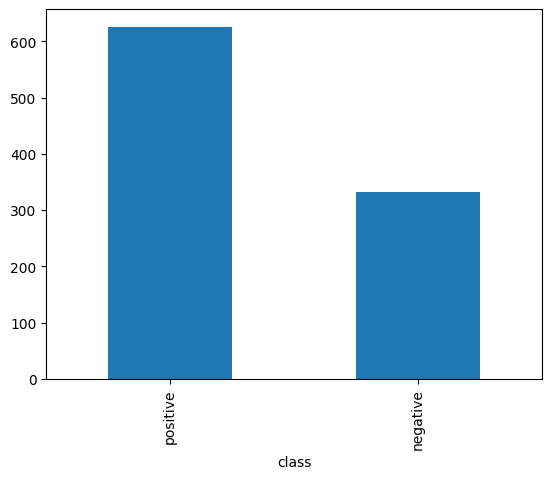

In [5]:
target = df.columns[-1]

# plot perbandingan class
df[target].value_counts().plot(kind='bar')

Dalam grafik diatas dapat disimpulkan bahwa dataset ini memiliki class yang imbalance, dimana class 'positive' memiliki jumlah yang lebih banyak dibandingkan class 'negative'.

In [6]:
# positive = df[df['class'] == 'positive'].sample(332)
# negative = df[df['class'] == 'negative']

# df = pd.concat([positive, negative])

In [7]:
# target = df.columns[-1]

# # plot perbandingan class
# df[target].value_counts().plot(kind='bar')

### Cek data duplikat

In [8]:
df.duplicated().sum()

0

Dataset yang digunakan tidak memiliki data duplikat

### Cek missing values

In [9]:
df.isna().sum()

top-left-square         0
top-middle-square       0
top-right-square        0
middle-left-square      0
middle-middle-square    0
middle-right-square     0
bottom-left-square      0
bottom-middle-square    0
bottom-right-square     0
class                   0
dtype: int64

Dari output program diatas. dipastika bahwa dataset tidak memiliki missing value dari setiap fiturnya.

### Cek Outlayer

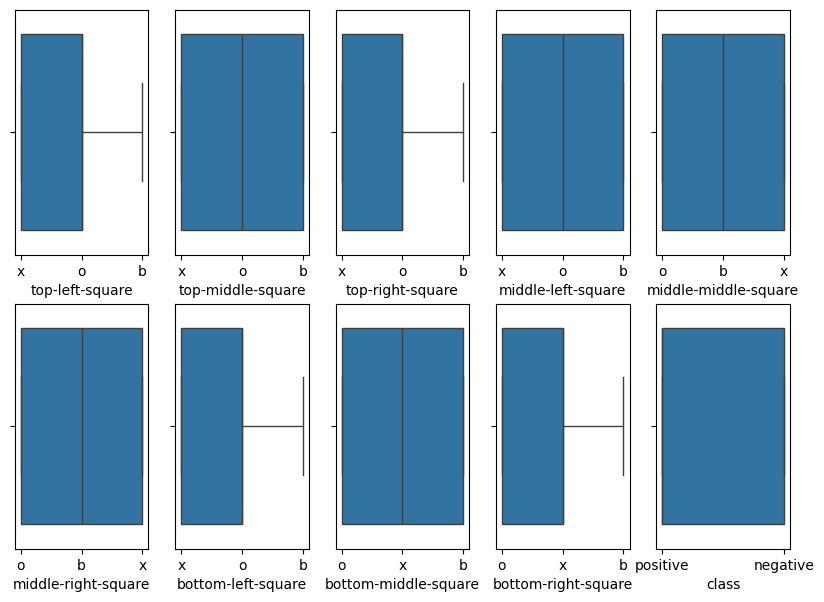

In [10]:
# check missing value with boxplot
target = df.columns

plt.figure(figsize=(10,7))

for i in target:
    plt.subplot(2, 5, list(target).index(i)+1)
    sns.boxplot(x=df[i])
plt.show()

Berdasarkan grafik boxplot diatas dapat disimpulkan bahwa setiap fitur dari dataset tidak memiliki outlier, karena tidak ada yang tidak melebihi nilai batas maksimal.

## Pre-processing

### Encode data

Encode data harus dilakukan karena dataset dan semua fitur memiliki tipe data katagorik. karena itu encode harus dilakukan untuk mempermudah modelling.

In [11]:
le_x = LabelEncoder().fit(df['top-left-square'])
le_y = LabelEncoder().fit(df['class'])

joblib.dump(le_x, 'feature_encoder.pkl')
joblib.dump(le_y, 'target_encoder.pkl')

encoded_df_x = df.drop(['class'], axis=1).apply(lambda x: le_x.transform(x))
encoded_df_y = df['class'].apply(lambda x: le_y.transform([x])[0])
encoded_df = encoded_df_x.join(encoded_df_y)

print(f'Before encode')
print(f'\n{df.apply(lambda x: x.unique())}\n')

print(f'After encode')
print(f'\n{encoded_df.apply(lambda x: x.unique())}\n')


Before encode

top-left-square                    [x, o, b]
top-middle-square                  [x, o, b]
top-right-square                   [x, o, b]
middle-left-square                 [x, o, b]
middle-middle-square               [o, b, x]
middle-right-square                [o, b, x]
bottom-left-square                 [x, o, b]
bottom-middle-square               [o, x, b]
bottom-right-square                [o, x, b]
class                   [positive, negative]
dtype: object

After encode

top-left-square         [2, 1, 0]
top-middle-square       [2, 1, 0]
top-right-square        [2, 1, 0]
middle-left-square      [2, 1, 0]
middle-middle-square    [1, 0, 2]
middle-right-square     [1, 0, 2]
bottom-left-square      [2, 1, 0]
bottom-middle-square    [1, 2, 0]
bottom-right-square     [1, 2, 0]
class                      [1, 0]
dtype: object



### Cek korelasi data

<Axes: >

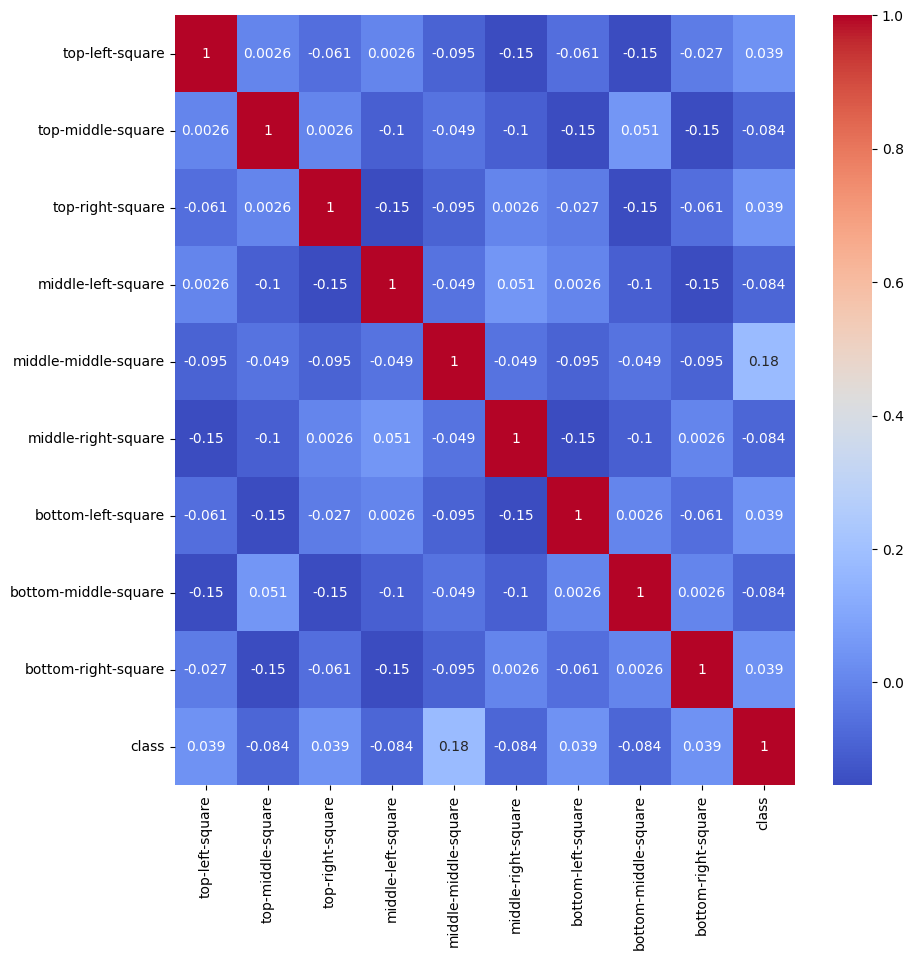

In [12]:
# check correlation
plt.figure(figsize=(10, 10))
sns.heatmap(encoded_df.corr(), annot=True, cmap='coolwarm')

## Modelling

### Split data

In [13]:
# split data
x_train, x_test, y_train, y_test = train_test_split(encoded_df_x, encoded_df_y, test_size=0.2, random_state=42)

df_train = x_train.join(y_train)
df_test = x_test.join(y_test)

# df_train.head()
# df_test.head()

### Modelling With Stacking

In [14]:
estimator = [
    ('knn_n3', KNeighborsClassifier(n_neighbors=3)),
    ('knn_n5', KNeighborsClassifier(n_neighbors=5)),
    ('rf', RandomForestClassifier(n_estimators=100)),
    ('nb', GaussianNB())
]

stacking_clf = StackingClassifier(
  estimators=estimator,
  final_estimator= RandomForestClassifier(n_estimators=100)
);

stacking_clf.fit(x_train, y_train)

predict = stacking_clf.predict(x_test)
predict_transform = le_y.inverse_transform(predict)

print(f'Predict: {predict_transform}\n')
print(f'Accuracy: {accuracy_score(y_test, predict)}\n')

Predict: ['negative' 'positive' 'positive' 'negative' 'negative' 'positive'
 'positive' 'positive' 'positive' 'negative' 'positive' 'positive'
 'positive' 'negative' 'positive' 'positive' 'positive' 'positive'
 'negative' 'negative' 'negative' 'positive' 'negative' 'positive'
 'negative' 'positive' 'positive' 'positive' 'negative' 'positive'
 'positive' 'positive' 'positive' 'positive' 'negative' 'negative'
 'positive' 'positive' 'positive' 'negative' 'positive' 'positive'
 'negative' 'negative' 'positive' 'negative' 'positive' 'positive'
 'negative' 'negative' 'negative' 'negative' 'positive' 'positive'
 'positive' 'positive' 'positive' 'negative' 'negative' 'positive'
 'positive' 'positive' 'negative' 'positive' 'positive' 'positive'
 'positive' 'negative' 'positive' 'positive' 'negative' 'negative'
 'negative' 'positive' 'negative' 'positive' 'positive' 'negative'
 'positive' 'negative' 'positive' 'positive' 'positive' 'positive'
 'positive' 'positive' 'negative' 'negative' 'positiv

In [15]:
joblib.dump(stacking_clf, 'stacking_model.pkl')

['stacking_model.pkl']

### Modelling with Bagging

In [16]:
estimators = [
  ('knn_n3', KNeighborsClassifier(n_neighbors=3)),
  ('knn_n5', KNeighborsClassifier(n_neighbors=5)),
  ('rf', RandomForestClassifier(n_estimators=100)),
  ('nb', GaussianNB())
]

bagging_clf = BaggingClassifier(estimator=RandomForestClassifier(), n_estimators=15, random_state=64)

bagging_clf.fit(x_train, y_train)

predict = bagging_clf.predict(x_test)
predict_transform = le_y.inverse_transform(predict)

print(f'Predict: {predict_transform}\n')
print(f'Accuracy: {accuracy_score(y_test, predict)}')

Predict: ['positive' 'positive' 'positive' 'negative' 'negative' 'positive'
 'positive' 'positive' 'positive' 'positive' 'positive' 'positive'
 'positive' 'negative' 'positive' 'positive' 'positive' 'positive'
 'negative' 'negative' 'negative' 'positive' 'negative' 'positive'
 'negative' 'positive' 'positive' 'positive' 'negative' 'positive'
 'positive' 'positive' 'positive' 'positive' 'negative' 'positive'
 'positive' 'positive' 'positive' 'negative' 'positive' 'positive'
 'negative' 'negative' 'positive' 'negative' 'positive' 'positive'
 'negative' 'negative' 'negative' 'negative' 'positive' 'positive'
 'positive' 'positive' 'positive' 'positive' 'negative' 'positive'
 'positive' 'positive' 'negative' 'positive' 'positive' 'positive'
 'positive' 'negative' 'positive' 'positive' 'positive' 'positive'
 'negative' 'positive' 'positive' 'positive' 'positive' 'positive'
 'positive' 'positive' 'positive' 'positive' 'positive' 'positive'
 'positive' 'positive' 'positive' 'negative' 'positiv

### Modelling with Random Forest

In [17]:
clf = RandomForestClassifier(random_state=512, n_estimators=1000)
clf.fit(x_train, y_train)

joblib.dump(clf, 'randforest_clf.pkl')

predict = clf.predict(x_test)
predict_transform = le_y.inverse_transform(predict)

print(f'Predict: {predict_transform}\n')
print(f'Accuracy: {accuracy_score(y_test, predict)}\n')

Predict: ['positive' 'positive' 'positive' 'negative' 'negative' 'positive'
 'positive' 'positive' 'positive' 'positive' 'positive' 'positive'
 'positive' 'negative' 'positive' 'positive' 'positive' 'positive'
 'negative' 'negative' 'negative' 'positive' 'negative' 'positive'
 'negative' 'positive' 'positive' 'positive' 'negative' 'positive'
 'positive' 'positive' 'positive' 'positive' 'negative' 'negative'
 'positive' 'positive' 'positive' 'negative' 'positive' 'positive'
 'negative' 'negative' 'positive' 'negative' 'positive' 'positive'
 'negative' 'negative' 'negative' 'negative' 'positive' 'positive'
 'positive' 'positive' 'positive' 'negative' 'negative' 'positive'
 'positive' 'positive' 'negative' 'positive' 'positive' 'positive'
 'positive' 'negative' 'positive' 'positive' 'negative' 'positive'
 'negative' 'positive' 'negative' 'positive' 'positive' 'negative'
 'positive' 'positive' 'positive' 'positive' 'positive' 'positive'
 'positive' 'positive' 'positive' 'negative' 'positiv

In [18]:
estimator = clf.estimators_[5]

export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = df.columns[:-1],
                class_names = ['negative', 'positive'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
Image(filename = 'tree.png')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.451828 to fit


## Evaluasi

Berdasarkan hasi modelling, bisa dipastikan bahwa metode stacking memiliki akurasi paling tinggi, karena itu metode ini dipilih sebagai model terbaik

              precision    recall  f1-score   support

           0       0.99      0.99      0.99        67
           1       0.99      0.99      0.99       125

    accuracy                           0.99       192
   macro avg       0.99      0.99      0.99       192
weighted avg       0.99      0.99      0.99       192



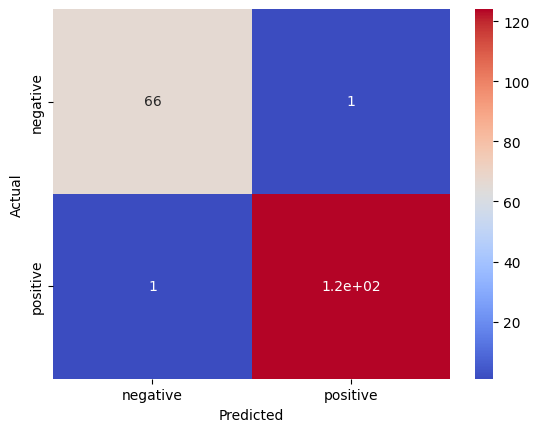

In [19]:
# accuracy score
y_pred = stacking_clf.predict(x_test)
accuracy_score(y_test, y_pred)

# classification report
print(classification_report(y_test, y_pred))

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
hm = sns.heatmap(cm, annot=True, cmap='coolwarm', xticklabels=le_y.classes_, yticklabels=le_y.classes_, )
hm = hm.set(xlabel='Predicted', ylabel='Actual')